<a href="https://colab.research.google.com/github/johanhoffman/DD2365_VT22/blob/GHusername1_lab4/Lab4/GHusername1_lab4_ALE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **The Navier-Stokes equations - ALE**
**Johan Hoffman**

# **Abstract**

This short report show an example on how to use FEniCS to solve the Navier-Stokes equations using an ALE method, which is used in the course DD2365 Advanced Computation in Fluid Mechanics, at the KTH Royal Institute of Technology.

[DD2365 course website.](https://www.kth.se/social/course/DD2365/)

# **About the code**

In [ ]:
"""This program is an example file for the course"""
"""DD2365 Advanced Computation in Fluid Mechanics, """
"""KTH Royal Institute of Technology, Stockholm, Sweden."""

# Copyright (C) 2021 Johan Hoffman (jhoffman@kth.se)

# This file is part of the course DD2365 Advanced Computation in Fluid Mechanics
# KTH Royal Institute of Technology, Stockholm, Sweden
#
# This is free software: you can redistribute it and/or modify
# it under the terms of the GNU Lesser General Public License v2.

# This template is maintained by Johan Hoffman
# Please report problems to jhoffman@kth.se

'KTH Royal Institute of Technology, Stockholm, Sweden.'

# **Set up environment**

In [ ]:
# Load neccessary modules.
from google.colab import files

import numpy as np
import time

# Install FEniCS (this may take a long time)
try:
    import dolfin
except ImportError:
    !wget "https://fem-on-colab.github.io/releases/fenics-install.sh" -O "/tmp/fenics-install.sh" && bash "/tmp/fenics-install.sh"
    import dolfin
    
from dolfin import *; from mshr import *

import dolfin.common.plotting as fenicsplot

from matplotlib import pyplot as plt

# **Introduction**

The Navier-Stokes equations take the form

$\dot u + (u\cdot \nabla)u + \nabla p -\Delta u = f,\quad \nabla \cdot u=0,$

together with suitable initial and boundary conditions.

Here we present a FEniCS implementation of a stabilized space-time Arbitrary Lagrangian-Eulerian (ALE) finite element method to solve the Navier-Stokes equations in 2D. The solution is visualized using FEniCS plotting functions, and is also exported as pvd-files which can be visualized in Paraview.

We seek a finite element approximation $(u,p)\in V\times Q$ such that 

$(\dot u + ((u-w)\cdot \nabla)u, v) - (p,\nabla \cdot v) + (\nu \nabla u,\nabla v) + (\nabla \cdot u, q) + SD(u,p;v,q) = (f,v),$

for all test functions $(v,q) \in \hat V\times \hat Q$, where $SD(u,p;v,q)$ is a residual based stabilization term. The mesh velocity is denoted by w. 

We present an example of flow past a circular cylinder, for which we compute the force on the surface of the cylinder $\Gamma$ in the direction $\phi$, by Green's formula: 

$
F(u,p,\phi)= ~<\nu \nabla u\cdot n-pn, \Phi>_{\Gamma} ~=~(\dot u+(u\cdot \nabla)u, \Phi) + (\nu \nabla u,\nabla \Phi) - (p,\nabla \cdot\Phi)-(f,\Phi),
$

with $\Phi\in V$ a fuinction for which $\Phi\vert _{\Gamma}=\phi$ and $\Phi\vert_{\partial \Omega \setminus \Gamma}=0$. With $\phi=(1,0)$ we get the drag force $F_D$, and with $\phi=(0,1)$ the lift force $F_L$. The drag and lift coefficients are obtained by normalization, 

$
c_D = \frac{2F_D}{\rho U^2D}, \quad c_L = \frac{2F_L}{\rho U^2D}
$

where $\rho$ is the density (here $\rho=1$), $U$ the characteristic velocity (here $U=1$), and $D$ the characteristic length scale (here $D$ is the diameter of the cylinder). 

The Reynolds number is defined as $Re=\frac{UD}{\nu}$

To read more about how to use similar methods for more complex problems, see e.g. 

[Hoffman, Johan, et al. "Towards a parameter-free method for high reynolds number turbulent flow simulation based on adaptive finite element approximation." Computer Methods in Applied Mechanics and Engineering 288 (2015): 60-74.](https://www.sciencedirect.com/science/article/pii/S0045782514004836)


# **Method**

**Define domain and mesh**

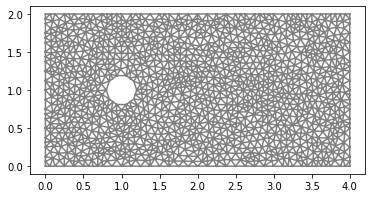

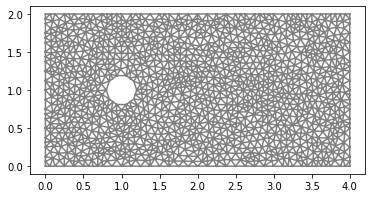

In [ ]:
# Define rectangular domain 
L = 4
H = 2

# Define circle
xc = 1.0
yc = 0.5*H
rc = 0.2

# Define subdomains (for boundary conditions)
class Left(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], 0.0) 

class Right(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], L)

class Lower(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], 0.0)

class Upper(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], H)
      
left = Left()
right = Right()
lower = Lower()
upper = Upper()

# Generate mesh (examples with and without a hole in the mesh) 
resolution = 32
#mesh = RectangleMesh(Point(0.0, 0.0), Point(L, H), L*resolution, H*resolution)
mesh = generate_mesh(Rectangle(Point(0.0,0.0), Point(L,H)) - Circle(Point(xc,yc),rc), resolution)

# Local mesh refinement (specified by a cell marker)
no_levels = 0
for i in range(0,no_levels):
  cell_marker = MeshFunction("bool", mesh, mesh.topology().dim())
  for cell in cells(mesh):
    cell_marker[cell] = False
    p = cell.midpoint()
    if p.distance(Point(xc, yc)) < 1.0:
        cell_marker[cell] = True
  mesh = refine(mesh, cell_marker)

# Define mesh functions (for boundary conditions)
boundaries = MeshFunction("size_t", mesh, mesh.topology().dim()-1)
boundaries.set_all(0)
left.mark(boundaries, 1)
right.mark(boundaries, 2)
lower.mark(boundaries, 3)
upper.mark(boundaries, 4)

# Generate mesh (examples with and without a hole in the mesh) 
#resolution = 32
#mesh = RectangleMesh(Point(0.0, 0.0), Point(L, H), L*resolution, H*resolution)
mesh_2 = generate_mesh(Rectangle(Point(0.0,0.0), Point(L,H)) - Circle(Point(xc,yc),rc), resolution)

# Local mesh refinement (specified by a cell marker)
no_levels = 0
for i in range(0,no_levels):
  cell_marker = MeshFunction("bool", mesh_2, mesh_2.topology().dim())
  for cell in cells(mesh_2):
    cell_marker[cell] = False
    p = cell.midpoint()
    if p.distance(Point(xc, yc)) < 1.0:
        cell_marker[cell] = True
  mesh_2 = refine(mesh_2, cell_marker)

# Define mesh functions (for boundary conditions)
boundaries = MeshFunction("size_t", mesh_2, mesh_2.topology().dim()-1)
boundaries.set_all(0)
left.mark(boundaries, 1)
right.mark(boundaries, 2)
lower.mark(boundaries, 3)
upper.mark(boundaries, 4)

plt.figure()
plot(mesh)
plt.figure()
plot(mesh_2)
plt.show()

**Define finite element approximation spaces**

In [ ]:
# Generate finite element spaces (for velocity and pressure)
V = VectorFunctionSpace(mesh, "Lagrange", 1)
Q = FunctionSpace(mesh, "Lagrange", 1)

# Define trial and test functions 
u = TrialFunction(V)
p = TrialFunction(Q)
v = TestFunction(V)
q = TestFunction(Q)

# Space for solution with circle fixed in y
# Generate finite element spaces (for velocity and pressure)
V_2 = VectorFunctionSpace(mesh_2, "Lagrange", 1)
Q_2 = FunctionSpace(mesh_2, "Lagrange", 1)

# Define trial and test functions 
u_2 = TrialFunction(V_2)
p_2 = TrialFunction(Q_2)
v_2 = TestFunction(V_2)
q_2 = TestFunction(Q_2)

**Define boundary conditions**

In [ ]:
# Define boundary conditions 
class DirichletBoundaryLower(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], 0.0)

class DirichletBoundaryUpper(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], H)

class DirichletBoundaryLeft(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], 0.0) 

class DirichletBoundaryRight(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], L)

class DirichletBoundaryObjects(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and (not near(x[0], 0.0)) and (not near(x[0], L)) and (not near(x[1], 0.0)) and (not near(x[1], H))

dbc_lower = DirichletBoundaryLower()
dbc_upper = DirichletBoundaryUpper()
dbc_left = DirichletBoundaryLeft()
dbc_right = DirichletBoundaryRight()
dbc_objects = DirichletBoundaryObjects()

# Examples of time dependent and stationary inflow conditions
#uin = Expression('4.0*x[1]*(1-x[1])', element = V.sub(0).ufl_element())
#uin = Expression('1.0 + 1.0*fabs(sin(t))', element = V.sub(0).ufl_element(), t=0.0)
uin = 1.0
bcu_in0 = DirichletBC(V.sub(0), uin, dbc_left)
bcu_in1 = DirichletBC(V.sub(1), 0.0, dbc_left)
bcu_upp0 = DirichletBC(V.sub(0), 0.0, dbc_upper)
bcu_upp1 = DirichletBC(V.sub(1), 0.0, dbc_upper)
bcu_low0 = DirichletBC(V.sub(0), 0.0, dbc_lower)
bcu_low1 = DirichletBC(V.sub(1), 0.0, dbc_lower)
bcu_obj0 = DirichletBC(V.sub(0), 0.0, dbc_objects)
bcu_obj1 = DirichletBC(V.sub(1), 0.0, dbc_objects)

bcu_in0_2 = DirichletBC(V_2.sub(0), uin, dbc_left)
bcu_in1_2 = DirichletBC(V_2.sub(1), 0.0, dbc_left)
bcu_upp0_2 = DirichletBC(V_2.sub(0), 0.0, dbc_upper)
bcu_upp1_2 = DirichletBC(V_2.sub(1), 0.0, dbc_upper)
bcu_low0_2 = DirichletBC(V_2.sub(0), 0.0, dbc_lower)
bcu_low1_2 = DirichletBC(V_2.sub(1), 0.0, dbc_lower)
bcu_obj0_2 = DirichletBC(V_2.sub(0), 0.0, dbc_objects)
bcu_obj1_2 = DirichletBC(V_2.sub(1), 0.0, dbc_objects)

pin = Expression('5.0*fabs(sin(t))', element = Q.ufl_element(), t=0.0)
pin_2 = Expression('5.0*fabs(sin(t))', element = Q_2.ufl_element(), t=0.0)

pout = 0.0
#bcp0 = DirichletBC(Q, pin, dbc_left) 
bcp1 = DirichletBC(Q, pout, dbc_right)
bcp1_2 = DirichletBC(Q, pout, dbc_right)

#bcu = [bcu_in0, bcu_in1, bcu_upp0, bcu_upp1, bcu_low0, bcu_low1, bcu_obj0, bcu_obj1]
bcu = [bcu_in0, bcu_in1, bcu_upp1, bcu_low1, bcu_obj0, bcu_obj1]
bcp = [bcp1]
bcu_2 = [bcu_in0_2, bcu_in1_2, bcu_upp1_2, bcu_low1_2, bcu_obj0_2, bcu_obj1_2]
bcp_2 = [bcp1_2]

# Define measure for boundary integration  
ds = Measure('ds', domain=mesh, subdomain_data=boundaries)
ds_2 = Measure('ds', domain=mesh_2, subdomain_data=boundaries)

# **Results**

**Define flow parameters**

In [ ]:
# Set viscosity
nu = 4.0e-3

**Define method parameters**

In [ ]:
# Define iteration functions
# (u0,p0) solution from previous time step
# (u1,p1) linearized solution at present time step  
u0 = Function(V)
u1 = Function(V)
p0 = Function(Q)
p1 = Function(Q)

u0_2 = Function(V_2)
u1_2 = Function(V_2)
p0_2 = Function(Q_2)
p1_2 = Function(Q_2)

# Change mesh def. so that circle does not move up and down but still deforms.
# What param. controls movement ???

# Define mesh deformation w, mesh velocity = w/dt
amp_x = 0.0
amp_y = 1.0e-2

amp_x_2 = 1.0e-2
amp_y_2 = 0.0

freq = 0.1
freq_2 = 0.1


t = 0         # OBS: Added t for w function to work, t = 0 correct ???

w = Expression(("amp_x*sin(2.0*pi*t*freq)*sin(pi*x[0]/L)","amp_y*sin(2.0*pi*t*freq-0.5*pi)*sin(pi*x[1]/H)"), L=L, H=H, t=t, amp_x=amp_x, amp_y=amp_y, freq=freq, element = V.ufl_element())
w_2 = Expression(("amp_x*sin(2.0*pi*t*freq)*sin(pi*x[0]/L)","amp_y*sin(2.0*pi*t*freq-0.5*pi)*sin(pi*x[1]/H)"), L=L, H=H, t=t, amp_x=amp_x_2, amp_y=amp_y_2, freq=freq_2, element = V_2.ufl_element())

# Set parameters for nonlinear and lienar solvers 
num_nnlin_iter = 5 
prec = "amg" if has_krylov_solver_preconditioner("amg") else "default" 

# Time step length 
dt = 0.5*mesh.hmin() 
dt_2 = 0.5*mesh_2.hmin() 

**Define variational problem**

In [ ]:
# Define variational problem

# Stabilization parameters
h = CellDiameter(mesh);
h_2 = CellDiameter(mesh_2);

u_mag = sqrt(dot(u1,u1))
u_mag_2 = sqrt(dot(u1_2,u1_2))

d1 = 1.0/sqrt((pow(1.0/dt,2.0) + pow(u_mag/h,2.0)))
d2 = h*u_mag
d1_2 = 1.0/sqrt((pow(1.0/dt_2,2.0) + pow(u_mag_2/h_2,2.0)))
d2_2 = h_2*u_mag_2

# Mean velocities for trapozoidal time stepping
um = 0.5*(u + u0)
um1 = 0.5*(u1 + u0)
um_2 = 0.5*(u_2 + u0_2)
um1_2 = 0.5*(u1_2 + u0_2)

# Momentum variational equation on residual form
Fu = inner((u - u0)/dt + grad(um)*(um1-w/dt), v)*dx - p1*div(v)*dx + nu*inner(grad(um), grad(v))*dx \
    + d1*inner((u - u0)/dt + grad(um)*(um1-w/dt) + grad(p1), grad(v)*(um1-w/dt))*dx + d2*div(um)*div(v)*dx 
au = lhs(Fu)
Lu = rhs(Fu)

Fu_2 = inner((u_2 - u0_2)/dt_2 + grad(um_2)*(um1_2-w_2/dt_2), v_2)*dx - p1_2*div(v_2)*dx + nu*inner(grad(um_2), grad(v_2))*dx \
    + d1_2*inner((u_2 - u0_2)/dt_2 + grad(um_2)*(um1_2-w_2/dt_2) + grad(p1_2), grad(v_2)*(um1_2-w_2/dt))*dx + d2_2*div(um_2)*div(v_2)*dx 
au_2 = lhs(Fu_2)
Lu_2 = rhs(Fu_2)

# Continuity variational equation on residual form
Fp = d1*inner((u1 - u0)/dt + grad(um1)*(um1-w/dt) + grad(p), grad(q))*dx + div(um1)*q*dx 
ap = lhs(Fp)
Lp = rhs(Fp)

Fp_2 = d1_2*inner((u1_2 - u0_2)/dt_2 + grad(um1_2)*(um1_2-w_2/dt_2) + grad(p_2), grad(q_2))*dx + div(um1_2)*q_2*dx 
ap_2 = lhs(Fp_2)
Lp_2 = rhs(Fp_2)



**Compute force on boundary**

In [ ]:
# Define the direction of the force to be computed 
phi_x = 1.0
phi_y = 0.0

phi_x_L = 0.0
phi_y_L = 1.0

#psi_expression = Expression(("0.0","pow(x[0]-0.5,2.0) + pow(x[1]-1.0,2.0) - pow(0.2,2.0) < 1.e-5 ? 1. : 0."), element = V.ufl_element())
psi_expression = Expression(("near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_x : 0.","near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_y : 0."), xc=xc, yc=yc, rc=rc, phi_x=phi_x, phi_y=phi_y, element = V.ufl_element())
psi = interpolate(psi_expression, V)

psi_expression_L = Expression(("near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_x : 0.","near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_y : 0."), xc=xc, yc=yc, rc=rc, phi_x=phi_x_L, phi_y=phi_y_L, element = V.ufl_element())
psi_L = interpolate(psi_expression_L, V)

Force = inner((u1 - u0)/dt + grad(um1)*um1, psi)*dx - p1*div(psi)*dx + nu*inner(grad(um1), grad(psi))*dx
Force_L = inner((u1 - u0)/dt + grad(um1)*um1, psi_L)*dx - p1*div(psi_L)*dx + nu*inner(grad(um1), grad(psi_L))*dx

#plt.figure()
#plot(psi, title="weight function psi")

#psi_expression_2 = Expression(("0.0","pow(x[0]-0.5,2.0) + pow(x[1]-1.0,2.0) - pow(0.2,2.0) < 1.e-5 ? 1. : 0."), element = V.ufl_element())
psi_expression_2 = Expression(("near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_x : 0.","near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_y : 0."), xc=xc, yc=yc, rc=rc, phi_x=phi_x, phi_y=phi_y, element = V_2.ufl_element())
psi_2 = interpolate(psi_expression_2, V_2)

psi_expression_L_2 = Expression(("near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_x : 0.","near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_y : 0."), xc=xc, yc=yc, rc=rc, phi_x=phi_x_L, phi_y=phi_y_L, element = V_2.ufl_element())
psi_L_2 = interpolate(psi_expression_L_2, V_2)

Force_2 = inner((u1_2 - u0_2)/dt_2 + grad(um1_2)*um1_2, psi_2)*dx - p1_2*div(psi_2)*dx + nu*inner(grad(um1_2), grad(psi_2))*dx
Force_L_2 = inner((u1_2 - u0_2)/dt_2 + grad(um1_2)*um1_2, psi_L_2)*dx - p1_2*div(psi_L_2)*dx + nu*inner(grad(um1_2), grad(psi_L_2))*dx


# Force normalization
D = 2*rc
normalization = -2.0/D

**Set plotting variables and open export files**

In [ ]:
# Open files to export solution to Paraview
file_u = File("results-NS/u.pvd")
file_p = File("results-NS/p.pvd")
file_u_L = File("results-NS/u_L.pvd")
file_p_L = File("results-NS/p_L.pvd")

file_u_2 = File("results-NS/u_2.pvd")
file_p_2 = File("results-NS/p_2.pvd")
file_u_L_2 = File("results-NS/u_L_2.pvd")
file_p_L_2 = File("results-NS/p_L_2.pvd")

# Set plot frequency
plot_time = 0
plot_freq = 20

# Force computation data 
force_array = np.array(0.0)
force_array = np.delete(force_array, 0)
force_array_L = np.array(0.0)
force_array_L = np.delete(force_array_L, 0)

force_array_2 = np.array(0.0)
force_array_2 = np.delete(force_array_2, 0)
force_array_L_2 = np.array(0.0)
force_array_L_2 = np.delete(force_array_L_2, 0)


time = np.array(0.0)
time = np.delete(time, 0)
start_sample_time = 1.0

**Time stepping algorithm**

Time t = 0.03285506167650246


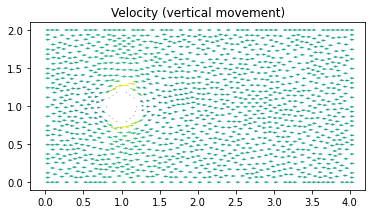

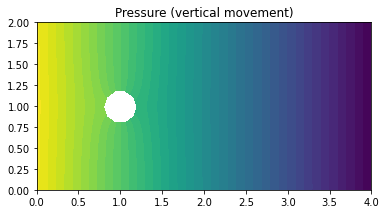

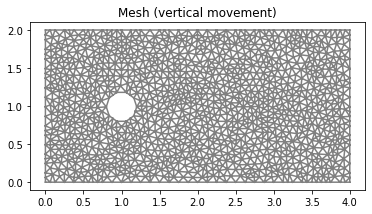

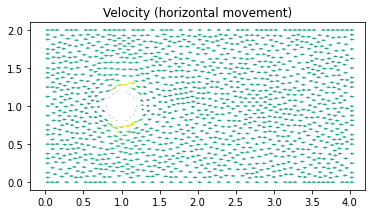

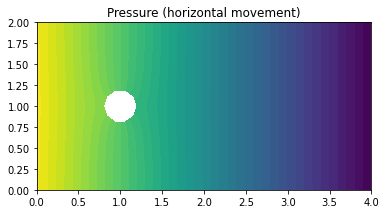

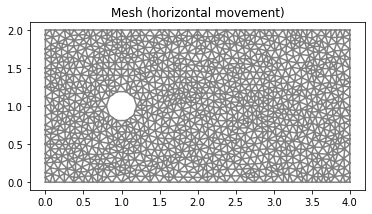

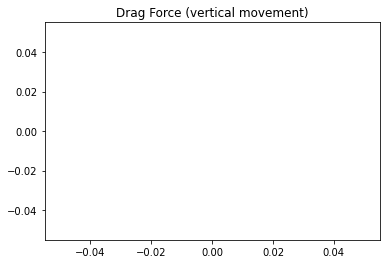

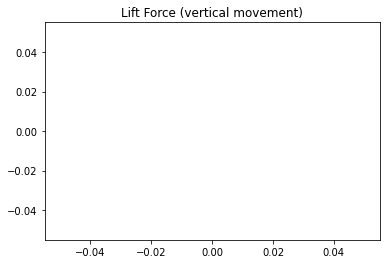

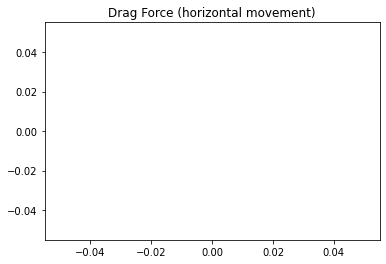

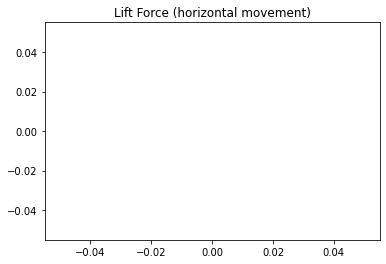

Time t = 1.5113328371191124


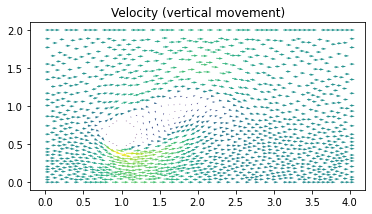

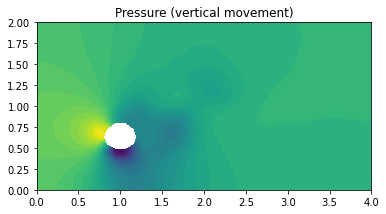

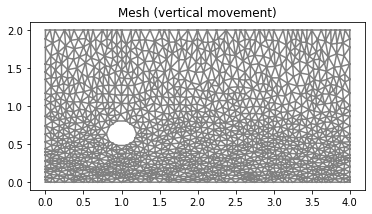

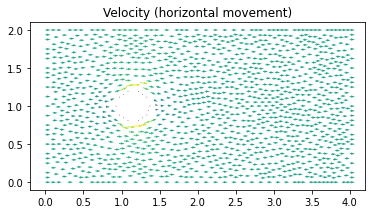

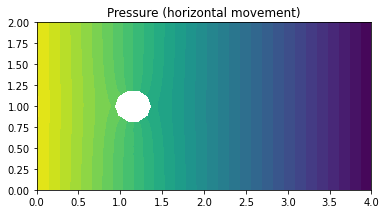

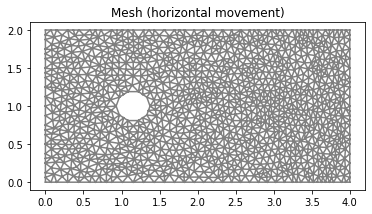

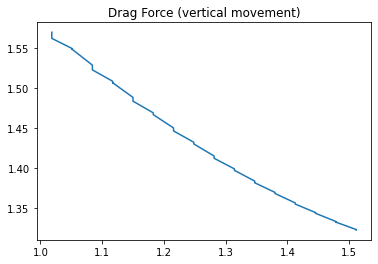

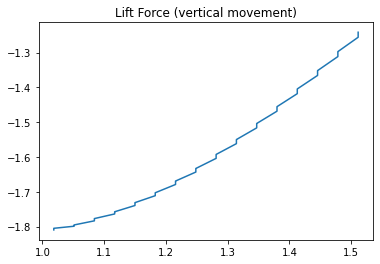

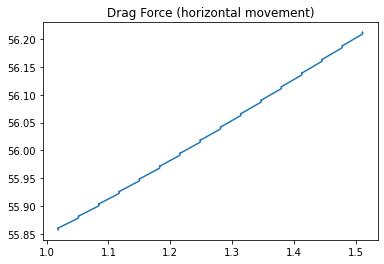

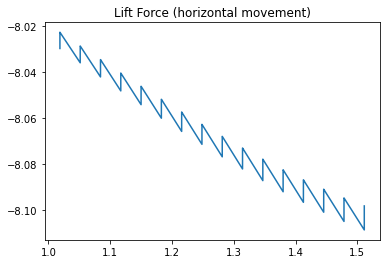

Time t = 3.022665674238231


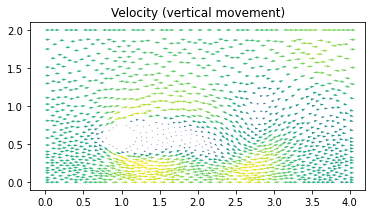

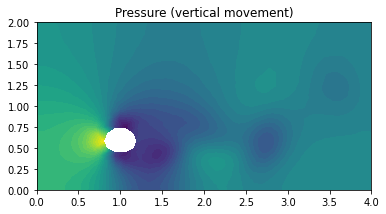

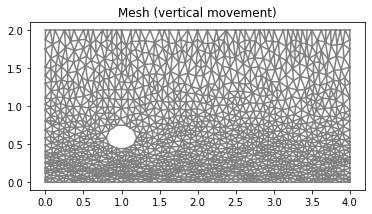

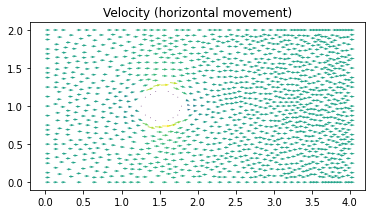

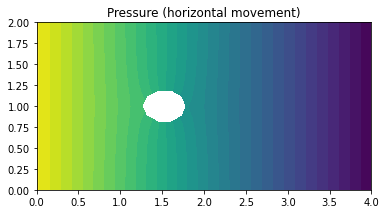

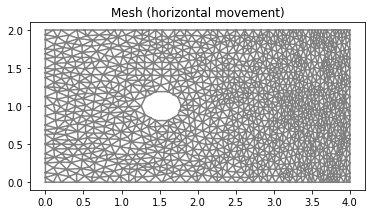

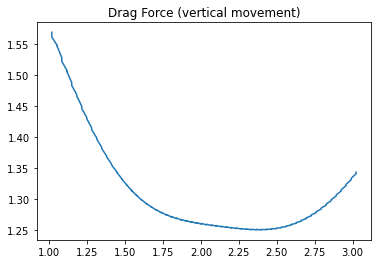

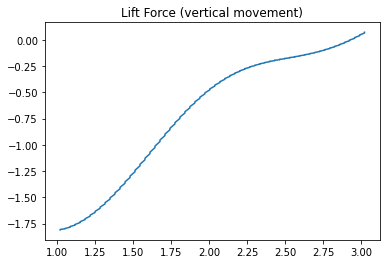

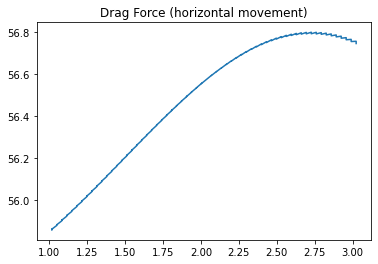

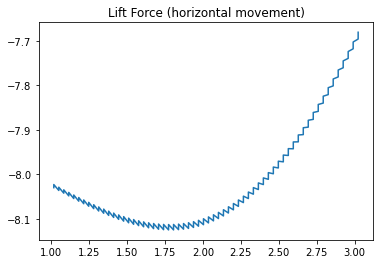

Time t = 4.50114344968085


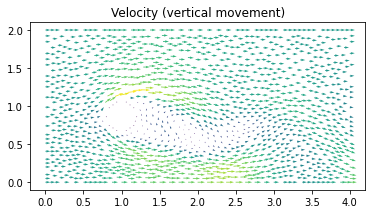

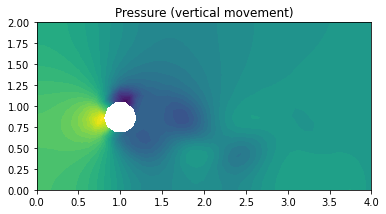

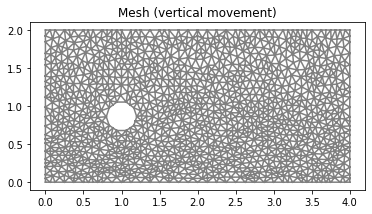

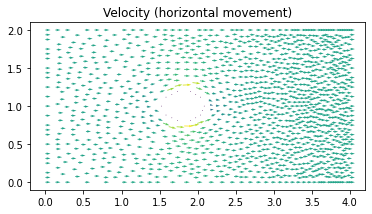

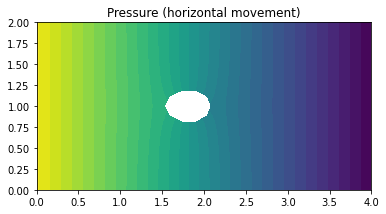

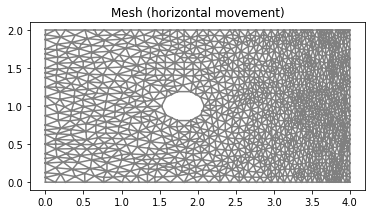

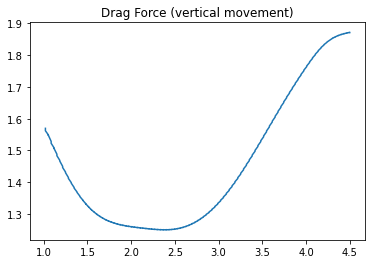

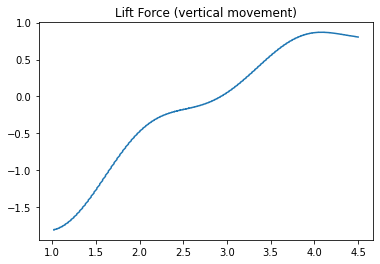

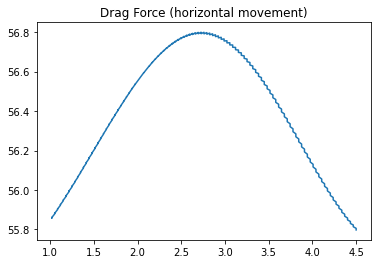

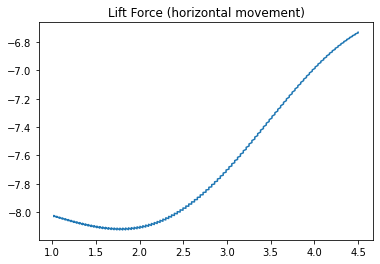

Time t = 6.012476286799972


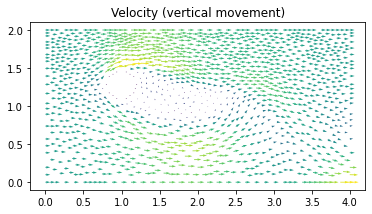

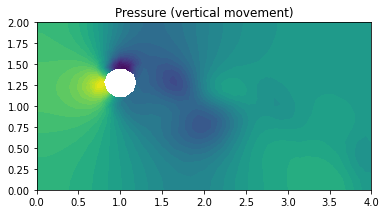

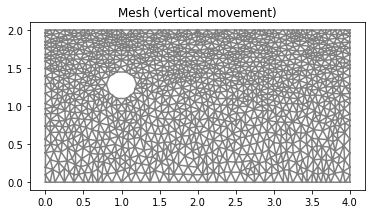

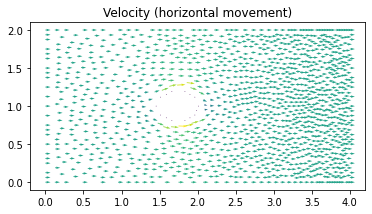

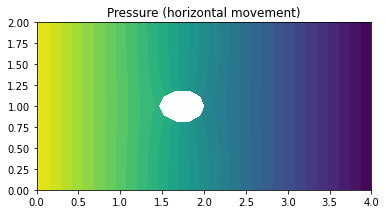

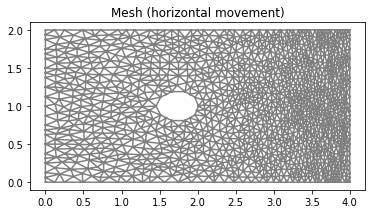

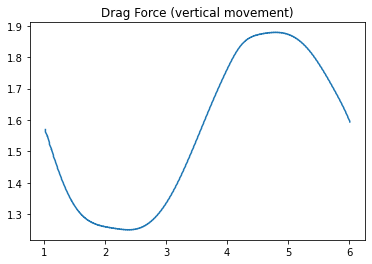

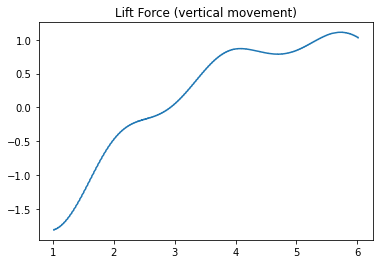

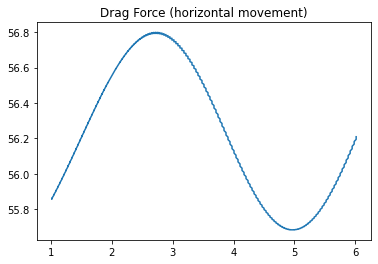

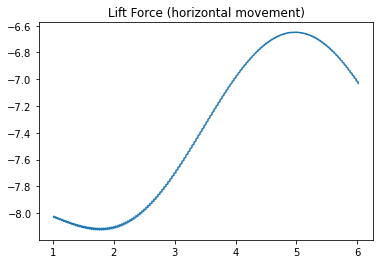

Time t = 7.523809123919094


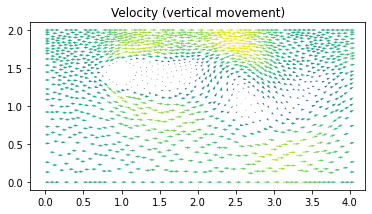

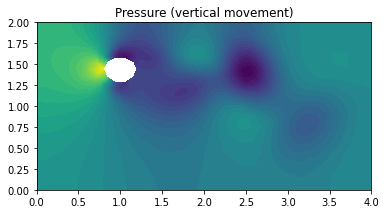

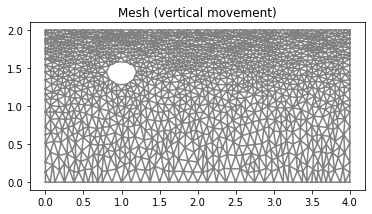

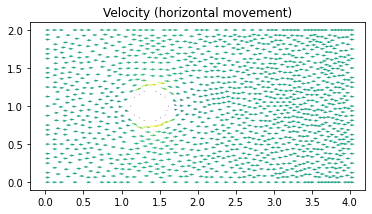

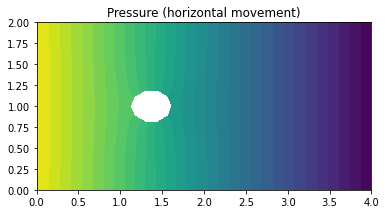

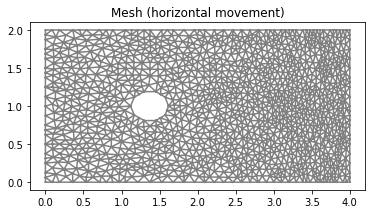

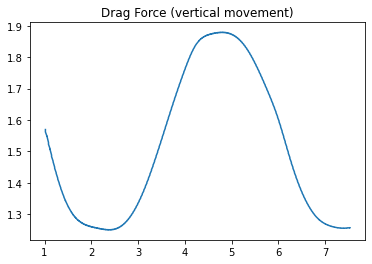

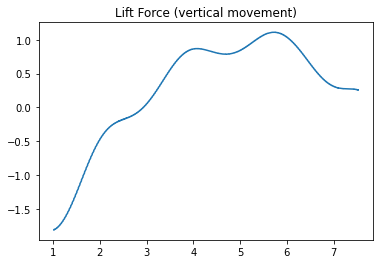

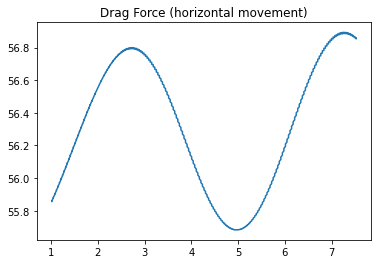

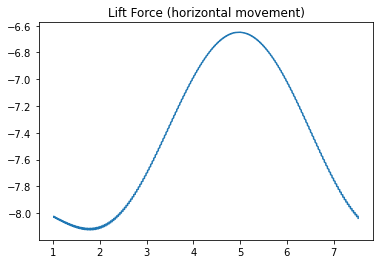

Time t = 9.002286899361685


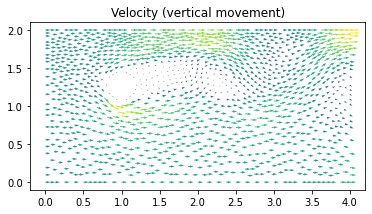

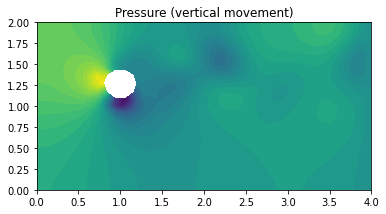

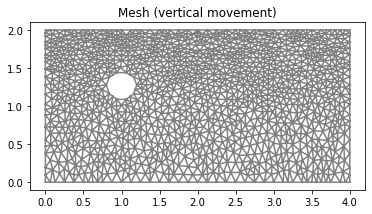

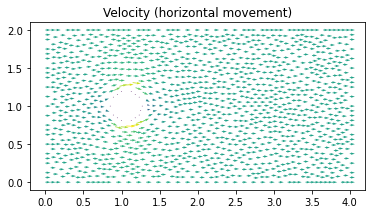

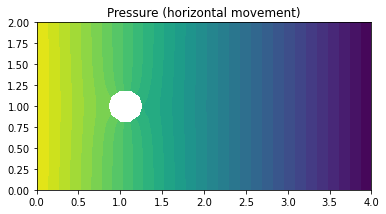

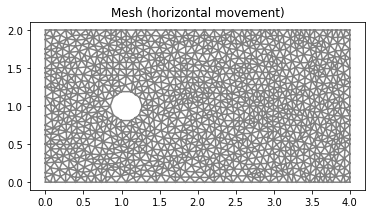

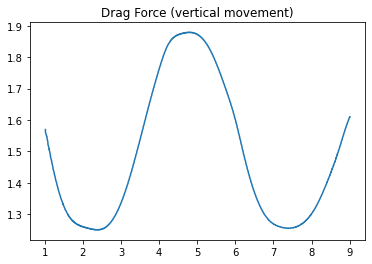

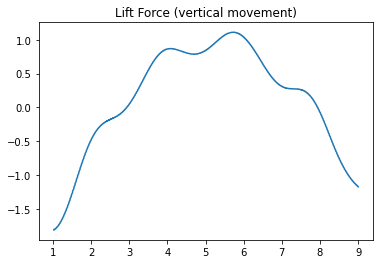

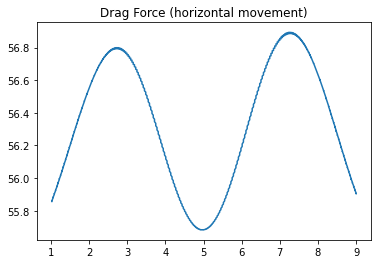

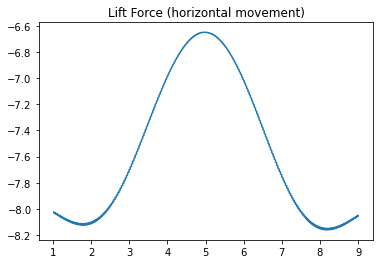

Time t = 10.513619736480766


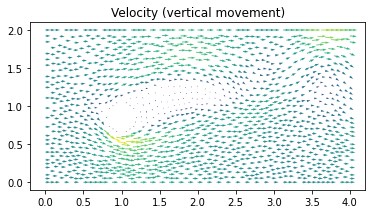

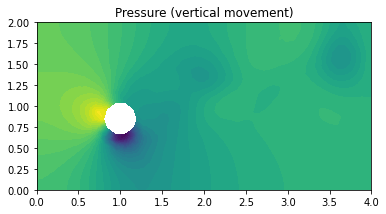

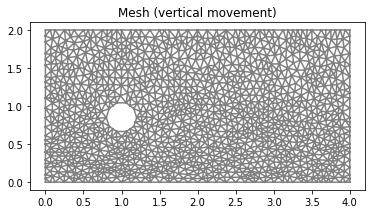

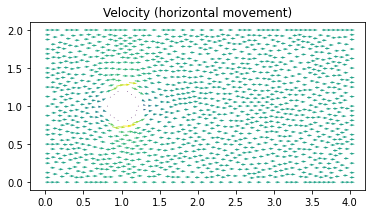

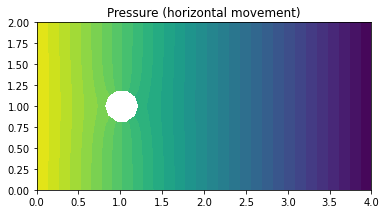

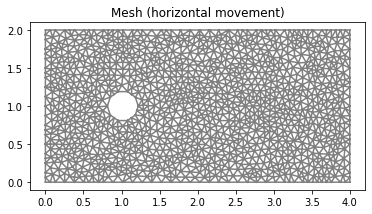

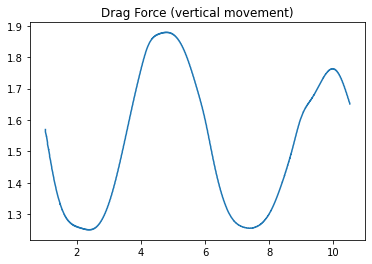

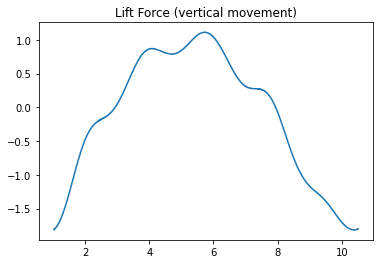

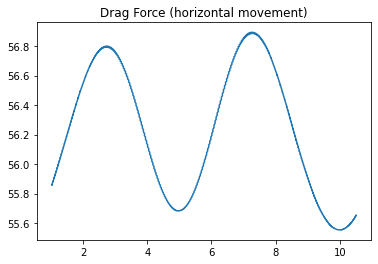

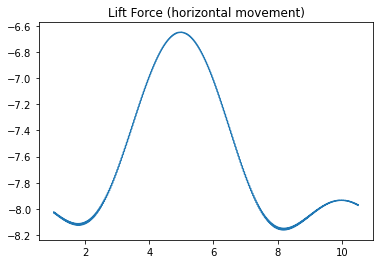

Time t = 12.024952573599847


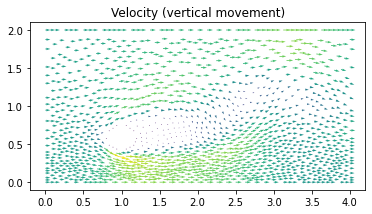

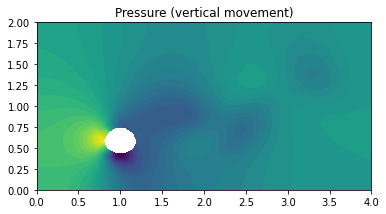

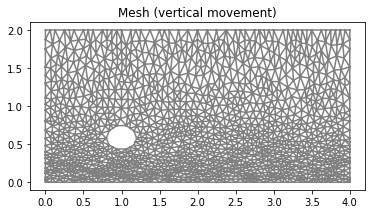

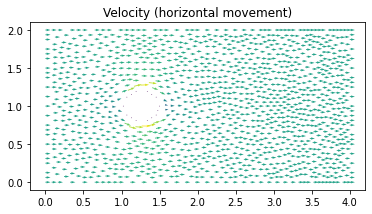

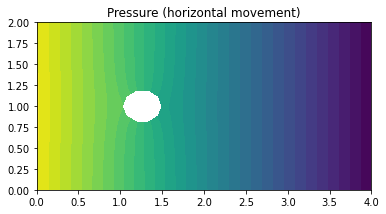

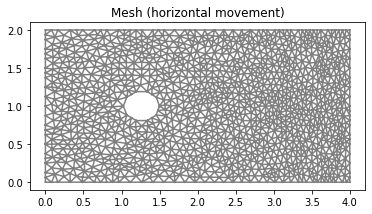

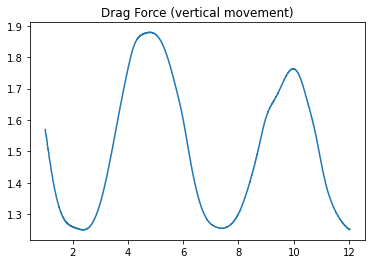

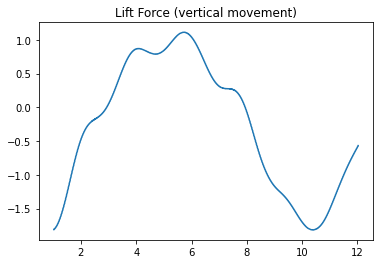

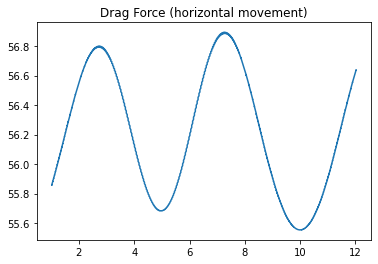

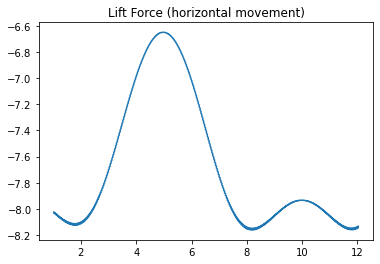

Time t = 13.503430349042427


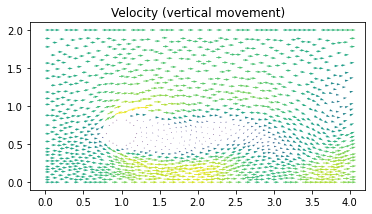

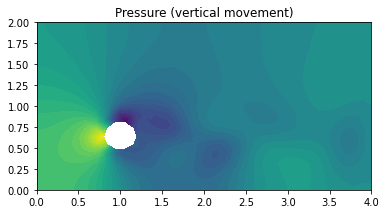

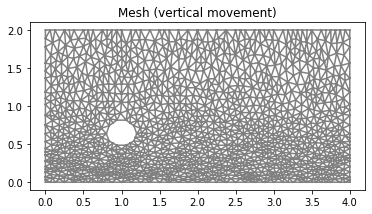

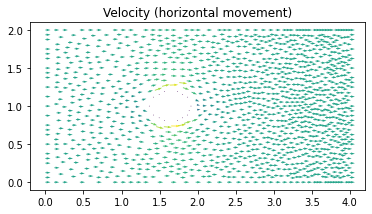

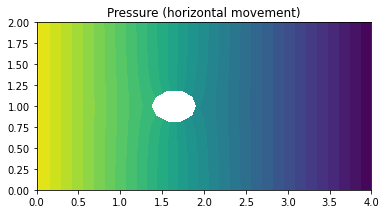

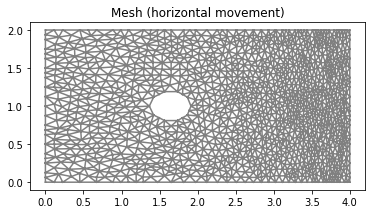

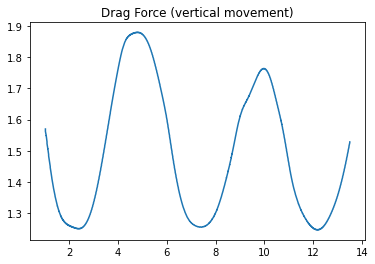

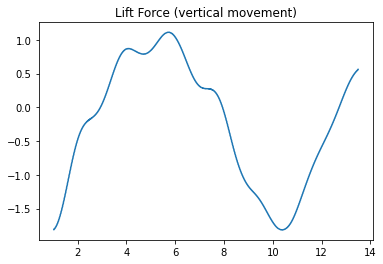

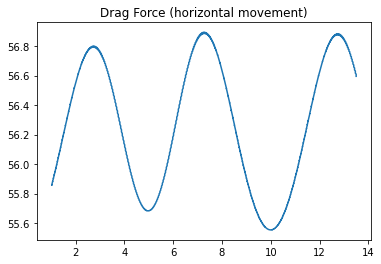

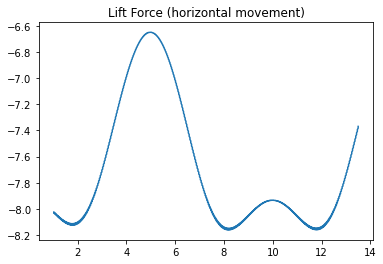

Time t = 15.014763186161508


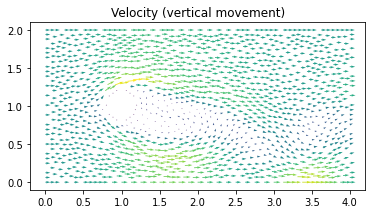

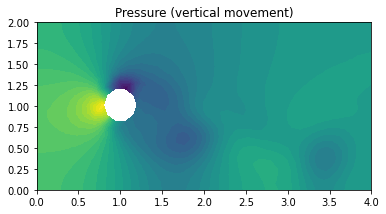

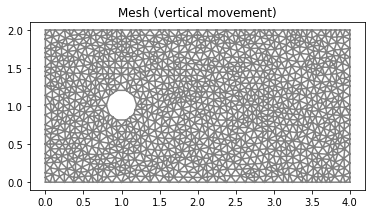

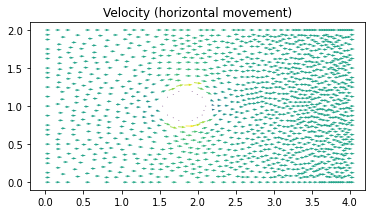

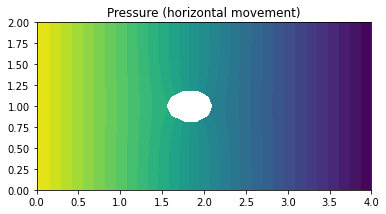

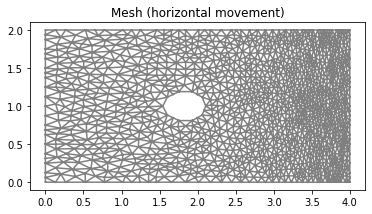

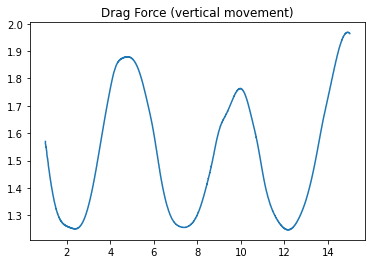

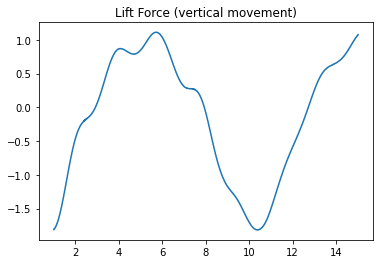

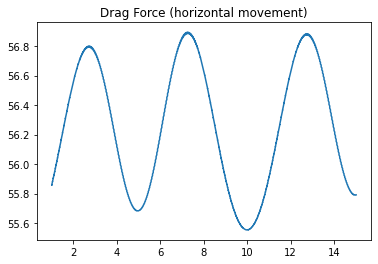

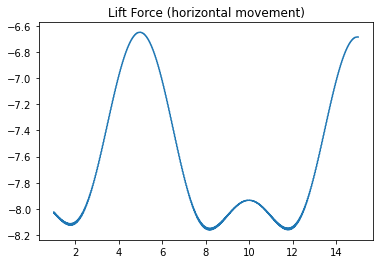

Time t = 16.52609602328062


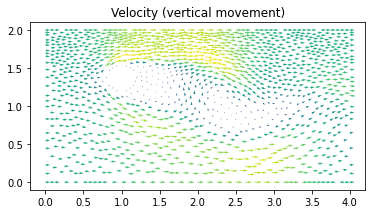

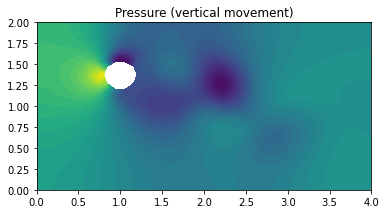

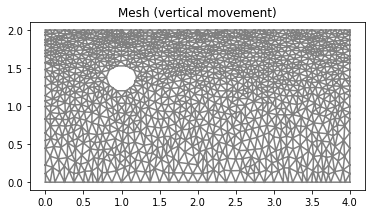

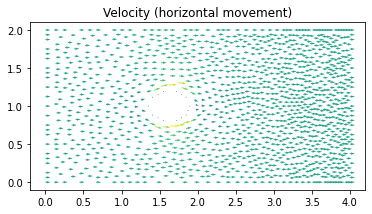

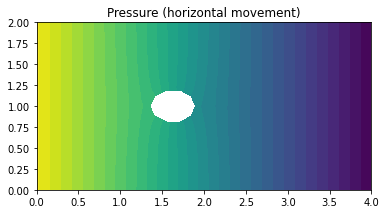

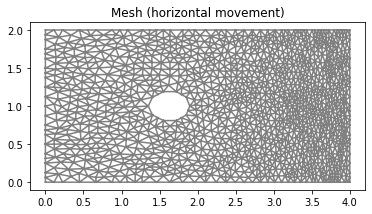

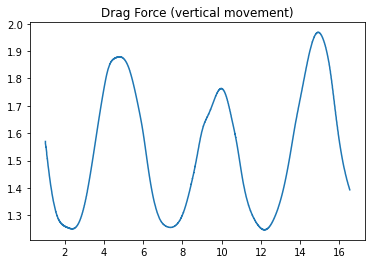

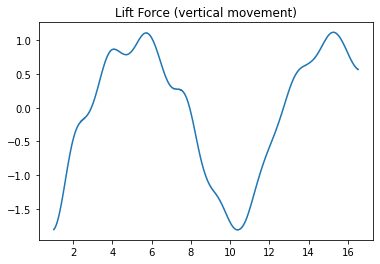

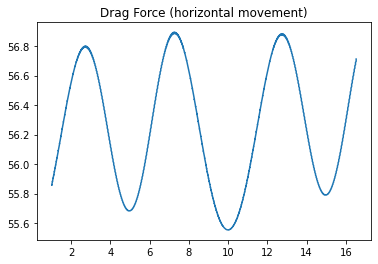

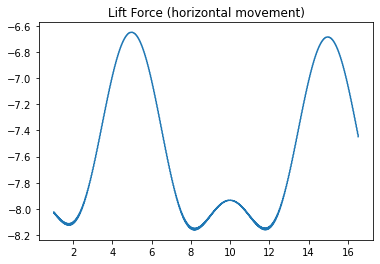

Time t = 18.00457379872328


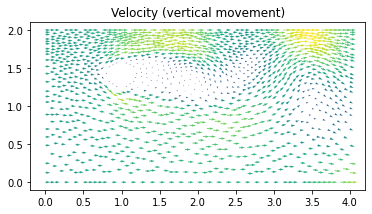

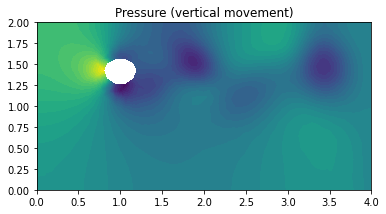

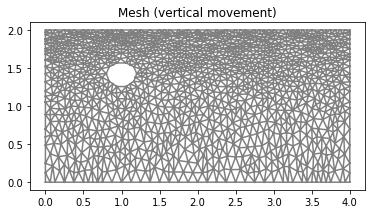

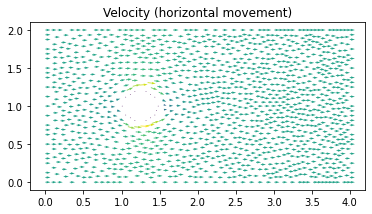

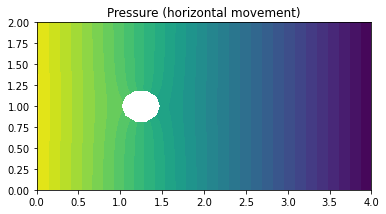

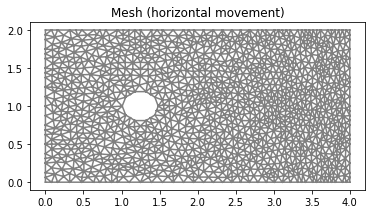

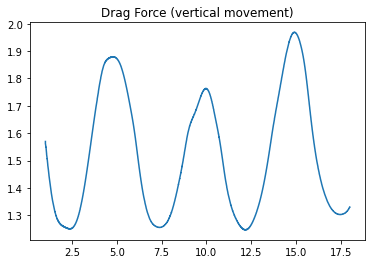

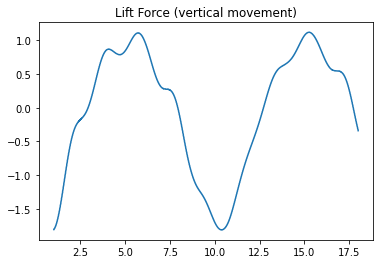

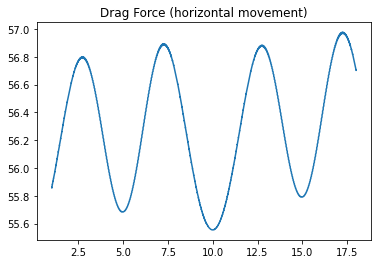

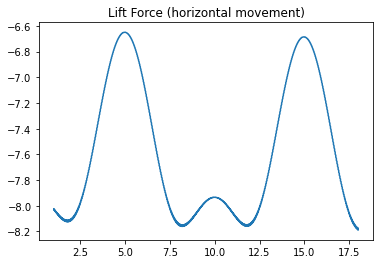

Time t = 19.51590663584244


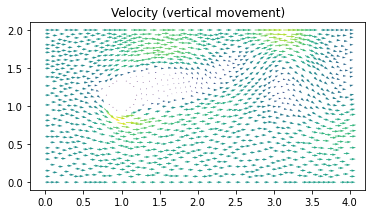

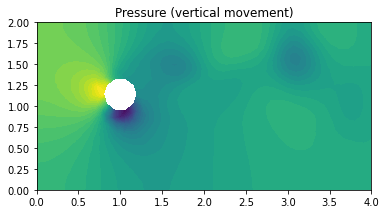

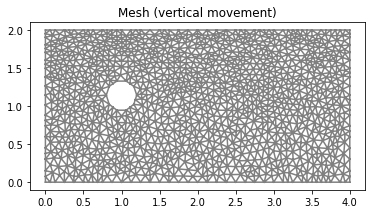

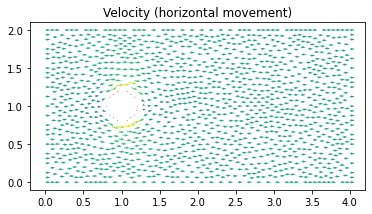

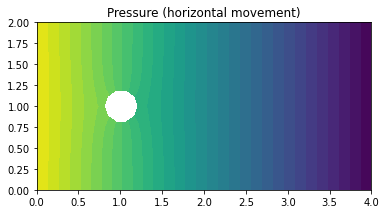

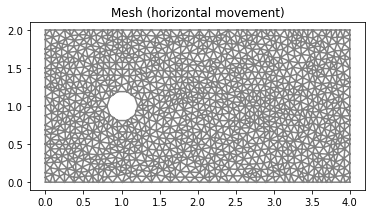

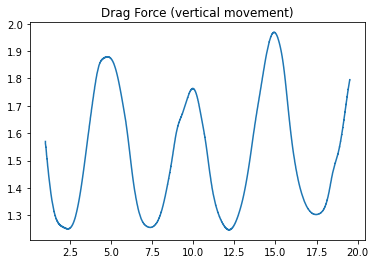

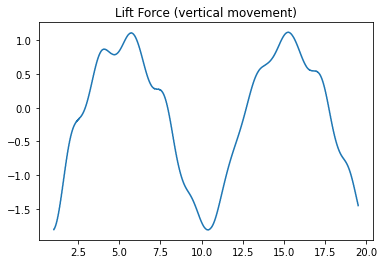

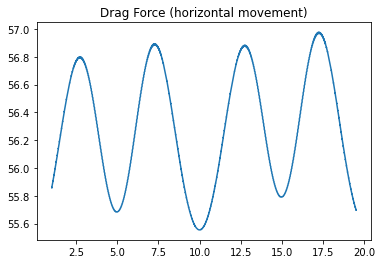

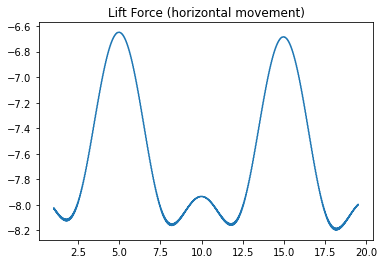

Time t = 21.027239472961604


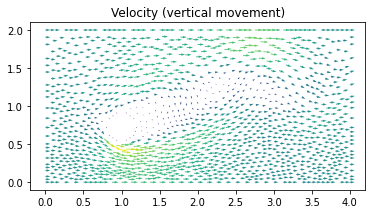

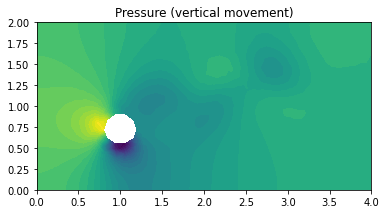

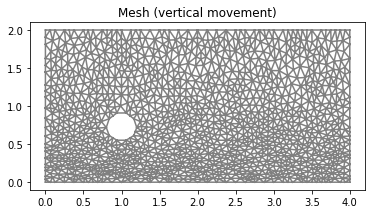

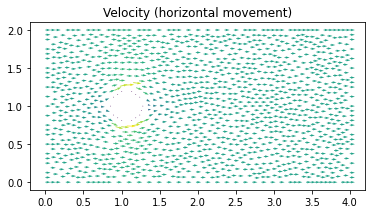

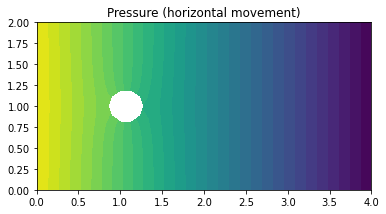

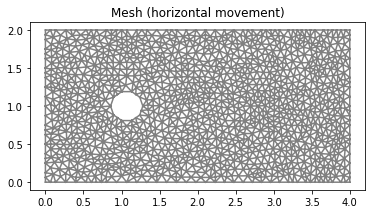

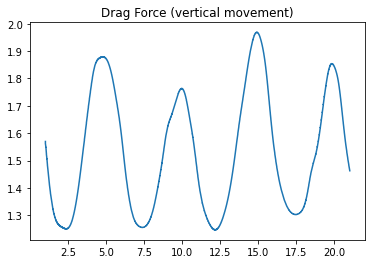

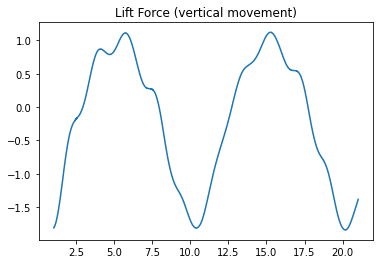

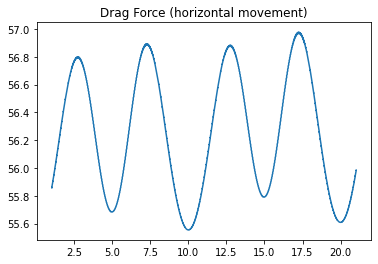

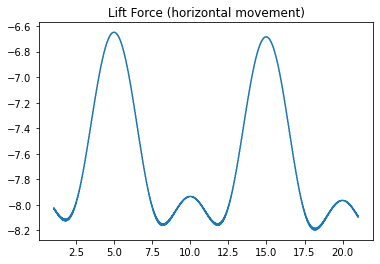

Time t = 22.505717248404263


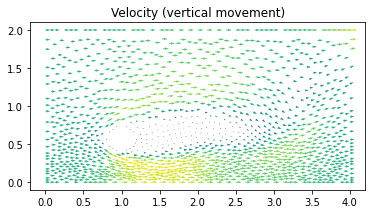

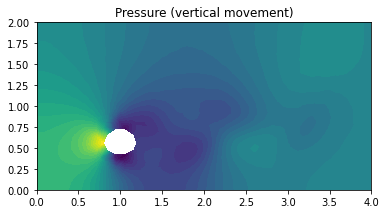

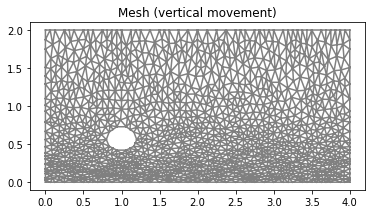

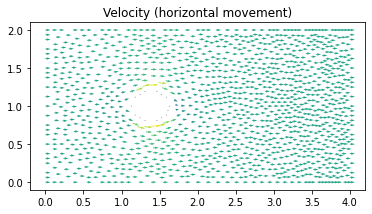

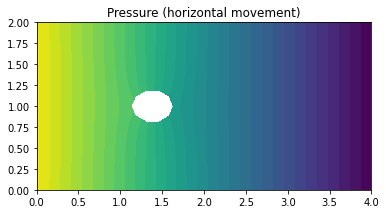

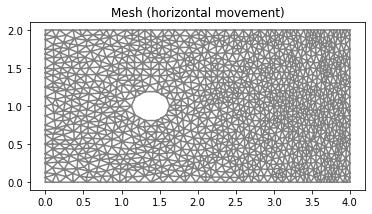

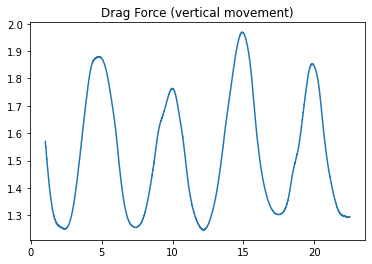

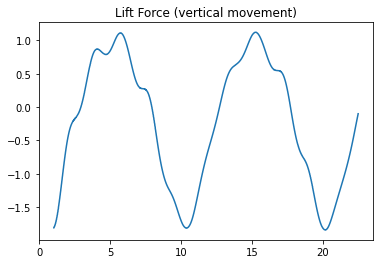

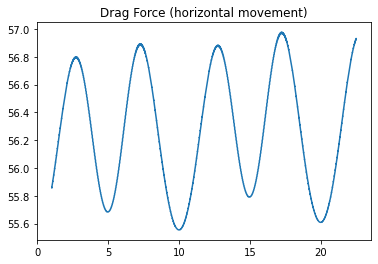

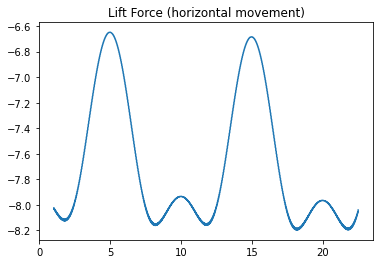

Time t = 24.017050085523426


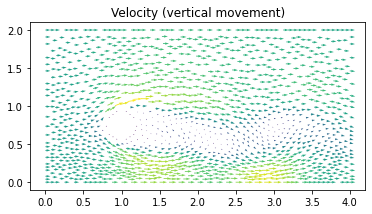

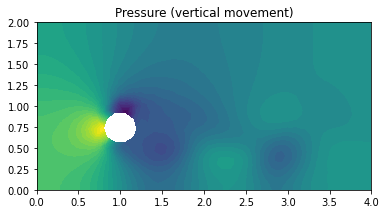

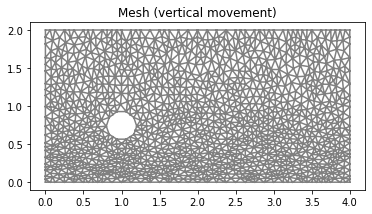

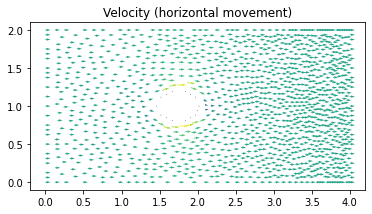

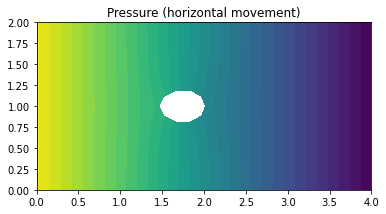

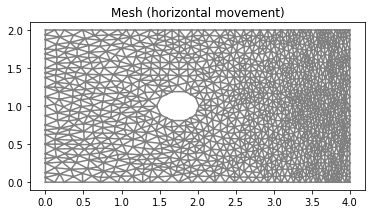

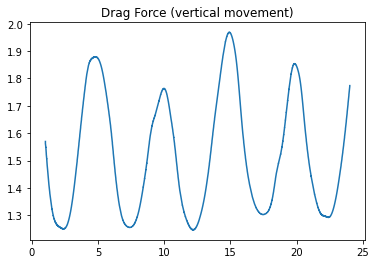

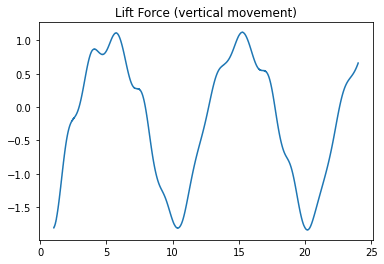

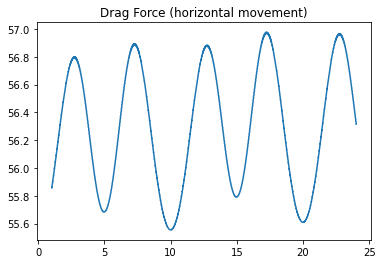

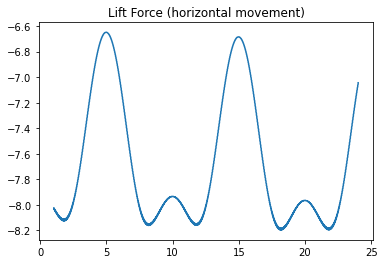

Time t = 25.52838292264259


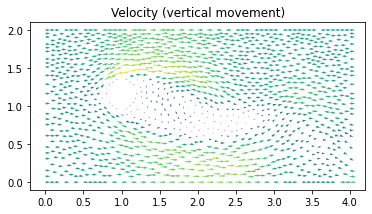

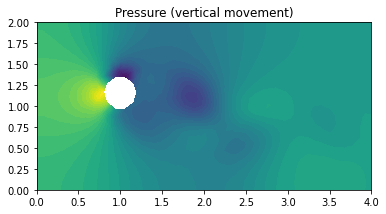

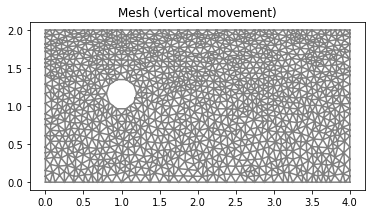

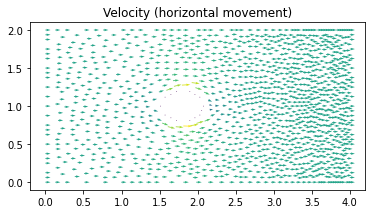

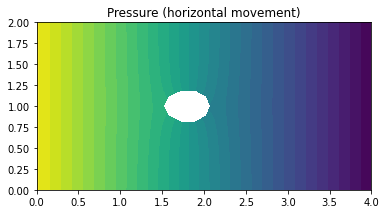

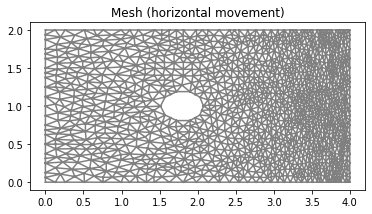

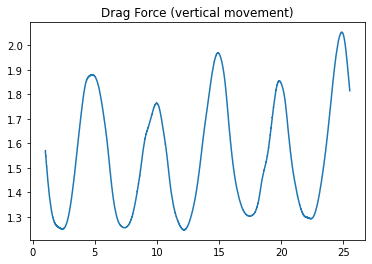

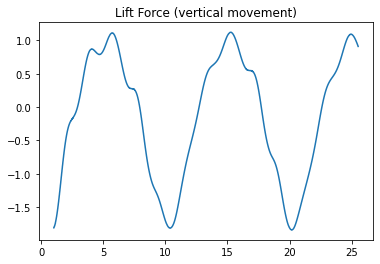

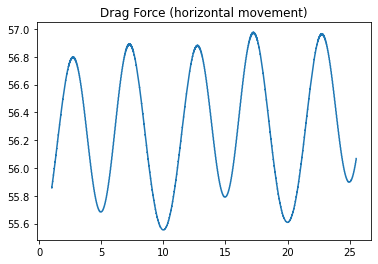

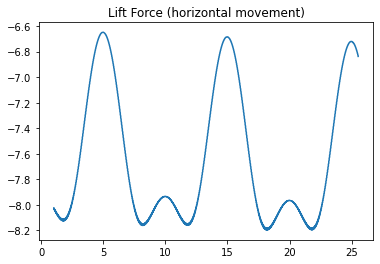

Time t = 27.006860698085248


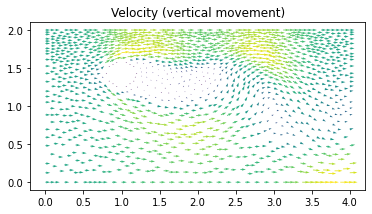

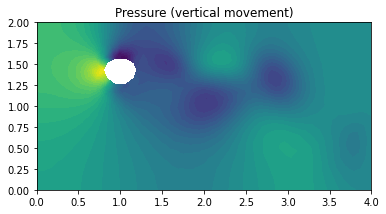

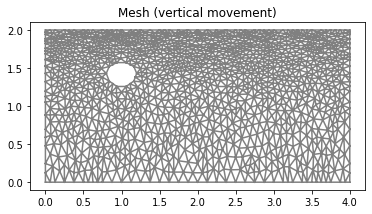

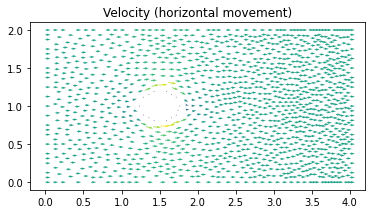

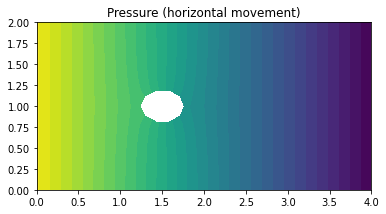

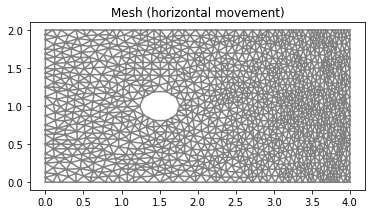

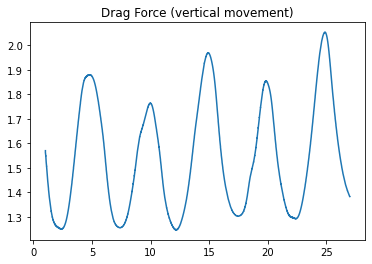

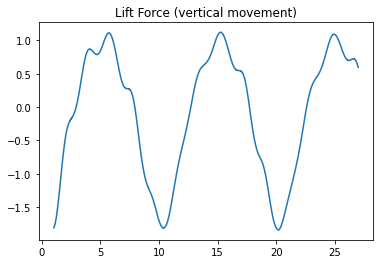

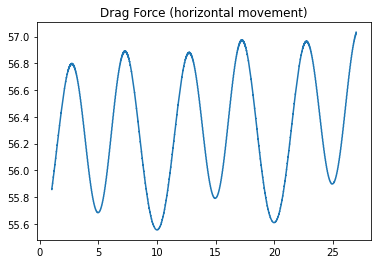

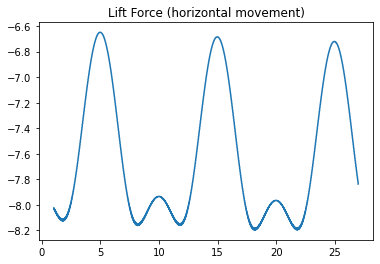

Time t = 28.51819353520441


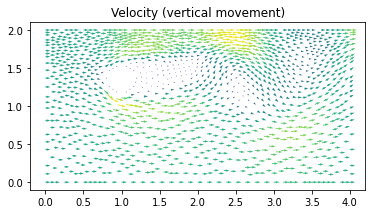

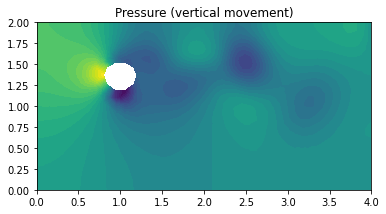

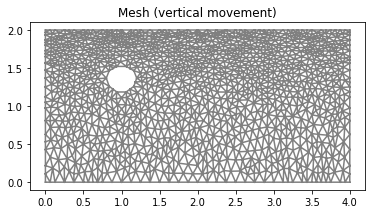

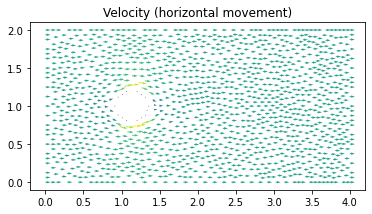

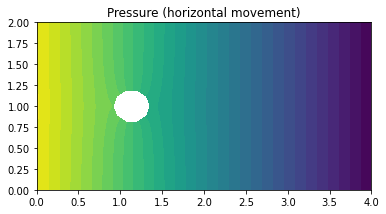

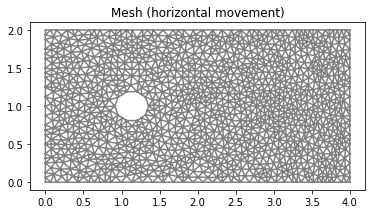

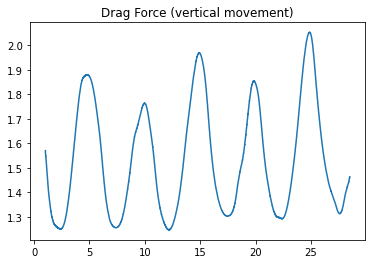

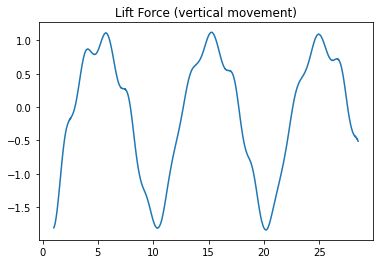

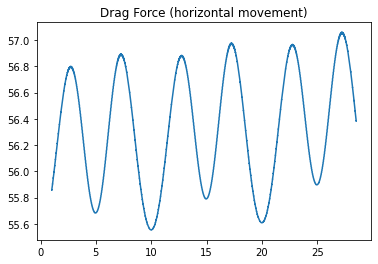

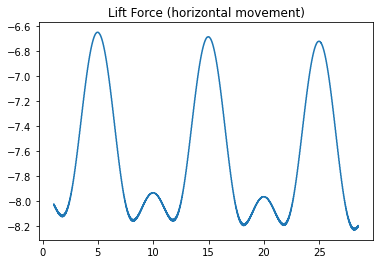

In [ ]:
!rm results-NS/*

# Time stepping 
T = 30
t = dt

while t < T + DOLFIN_EPS:

    #s = 'Time t = ' + repr(t) 
    #print(s)

    pin.t = t
    #uin.t = t

    w.t = t 
    ALE.move(mesh, w)
    w_2.t = t 
    ALE.move(mesh_2, w_2)

    # Solve non-linear problem 
    k = 0
    while k < num_nnlin_iter: 
        
        # Assemble momentum matrix and vector 
        Au = assemble(au)
        bu = assemble(Lu)
        Au_2 = assemble(au_2)
        bu_2 = assemble(Lu_2)

        # Compute velocity solution 
        [bc.apply(Au, bu) for bc in bcu]
        [bc.apply(u1.vector()) for bc in bcu]
        solve(Au, u1.vector(), bu, "bicgstab", "default")

        [bc_2.apply(Au_2, bu_2) for bc_2 in bcu_2]
        [bc_2.apply(u1_2.vector()) for bc_2 in bcu_2]
        solve(Au_2, u1_2.vector(), bu_2, "bicgstab", "default")

        # Assemble continuity matrix and vector
        Ap = assemble(ap) 
        bp = assemble(Lp)

        Ap_2 = assemble(ap_2) 
        bp_2 = assemble(Lp_2)

        # Compute pressure solution 
        [bc.apply(Ap, bp) for bc in bcp]
        [bc.apply(p1.vector()) for bc in bcp]
        solve(Ap, p1.vector(), bp, "bicgstab", prec)

        [bc_2.apply(Ap_2, bp_2) for bc_2 in bcp_2]
        [bc_2.apply(p1_2.vector()) for bc_2 in bcp_2]
        solve(Ap_2, p1_2.vector(), bp_2, "bicgstab", prec)

        # Compute force
        F = assemble(Force)
        F_L = assemble(Force_L)

        F_2 = assemble(Force_2)
        F_L_2 = assemble(Force_L_2)

        if (t > start_sample_time):
          force_array = np.append(force_array, normalization*F)
          force_array_L = np.append(force_array_L, normalization*F_L)

          force_array_2 = np.append(force_array_2, normalization*F_2)
          force_array_L_2 = np.append(force_array_L_2, normalization*F_L_2)

          time = np.append(time, t)

        k += 1

    if t > plot_time:     
        
        s = 'Time t = ' + repr(t) 
        print(s)
    
        # Save solution to file
        file_u << u1
        file_p << p1
        file_u_2 << u1_2
        file_p_2 << p1_2

        # Plot solution
        plt.figure()
        plot(u1, title="Velocity (vertical movement)")

        plt.figure()
        plot(p1, title="Pressure (vertical movement)")

        plt.figure()
        plot(mesh, title="Mesh (vertical movement)")

        plt.figure()
        plot(u1_2, title="Velocity (horizontal movement)")

        plt.figure()
        plot(p1_2, title="Pressure (horizontal movement)")

        plt.figure()
        plot(mesh_2, title="Mesh (horizontal movement)")
        
        plot_time += T/plot_freq
        
        plt.show()

        plt.figure()
        plt.title("Drag Force (vertical movement)")
        plt.plot(time, force_array)
        plt.figure()
        plt.title("Lift Force (vertical movement)")
        plt.plot(time, force_array_L)
        plt.figure()
        plt.title("Drag Force (horizontal movement)")
        plt.plot(time, force_array_2)
        plt.figure()
        plt.title("Lift Force (horizontal movement)")
        plt.plot(time, force_array_L_2)

        plt.show()

    # Update time step
    u0.assign(u1)
    t += dt

#!tar -czvf results-NS.tar.gz results-NS
#files.download('results-NS.tar.gz')

# **Discussion**

A stabilized finite element method was implemented in FEniCS to solve the Navier-Stokes equations in 2D using an ALE finite element method. 

1. Study the change in drag and lift force for the moving cylinder, how do the forces change as the cylinder moves and deform? As the cylinder moves and is compressed in the y-direction (up and down) the drag force decreases, this might be because the deformed cylinder has a smaller cross section towards the flow which generates a "smoother" flow over the deformed cylinder. The lift force is also low at the deformed position compared to the undeformed position.

2. Modify the mesh deformation function so that the cylinder does not move up and down, but still deforms. How does this change the drag and lift forces? Looking at the case where the cylinder moves and deforms in the x-direction (left and right) it is clear that the drag force is much larger since the cross section remains large in the direction of the flow. As the cylinder deforms it is less streamlined compared to the case where the cylinder is deformed in the y-direction. The lift force ocillates between larger negative values as the cylinder deforms in the x-direction.